Normalized ensemble weights: [0.3357664233576642, 0.3175182481751825, 0.34671532846715325]
1/1 [==============================] - 9s 9s/step
Ensemble prediction: [4]
Deleting existing file: D:\\CADT\\CapstoneProjectI\\ml__model\\models\\ensemble_3model.h5
Error saving model: Unable to synchronously create dataset (name already exists)
Found 1737 images belonging to 7 classes.
55/55 [==============================] - 29s 473ms/step
Ensemble Test Accuracy: 94.88%

Found 89 mispredicted images.


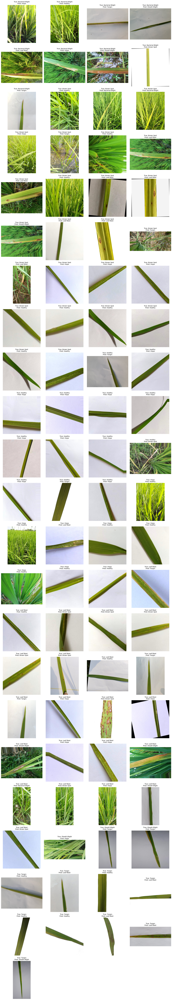

In [1]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Layer, Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from PIL import Image

# Load the saved models
densenet121 = load_model(r'D:\\CADT\\CapstoneProjectI\\ml__model\\notebooks\\densenet121_7classes_model.h5')
mobilenetv2 = load_model(r'D:\\CADT\\CapstoneProjectI\\ml__model\\notebooks\\mobilenetv2_7classes_model.h5')

# Rebuild EfficientNetB0 architecture and load weights
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(7, activation='softmax')(x)
efficientnet_b0 = Model(inputs=base_model.input, outputs=predictions)

# Load the weights
efficientnet_b0.load_weights(r'D:\\CADT\\CapstoneProjectI\\ml__model\\models\\efficientnetb0_weights.h5')

# List of models for the ensemble
models = [densenet121, mobilenetv2, efficientnet_b0]

# Define weights based on accuracy
ensemble_weights = [0.92, 0.87, 0.95]  # Proportional to accuracies
ensemble_weights = [w / sum(ensemble_weights) for w in ensemble_weights]  # Normalize to sum to 1
print("Normalized ensemble weights:", ensemble_weights)

# Custom layer for ensemble with get_config
class EnsembleLayer(Layer):
    def __init__(self, models, ensemble_weights, **kwargs):
        super(EnsembleLayer, self).__init__(**kwargs)
        self.models = models
        self.ensemble_weights = ensemble_weights

    def call(self, inputs):
        predictions = [model(inputs) for model in self.models]
        return tf.tensordot(predictions, self.ensemble_weights, axes=((0), (0)))

    def get_config(self):
        config = super(EnsembleLayer, self).get_config()
        config.update({
            "ensemble_weights": self.ensemble_weights
        })
        return config

# Create the ensemble model
inputs = tf.keras.Input(shape=(224, 224, 3))
ensemble_output = EnsembleLayer(models, ensemble_weights)(inputs)
ensemble_model = tf.keras.Model(inputs=inputs, outputs=ensemble_output, name='ensemble_model')

# Compile the ensemble model
ensemble_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Test with dummy input
dummy_input = np.random.rand(1, 224, 224, 3).astype(np.float32)
ensemble_output = ensemble_model.predict(dummy_input)
predicted_class = np.argmax(ensemble_output, axis=1)
print("Ensemble prediction:", predicted_class)

# Save the ensemble model
save_path = r'D:\\CADT\\CapstoneProjectI\\ml__model\\models\\ensemble_3model.h5'
try:
    if os.path.exists(save_path):
        print(f"Deleting existing file: {save_path}")
        os.remove(save_path)
        import time
        time.sleep(1)
    ensemble_model.save(save_path)
    print(f"Ensemble model saved as '{save_path}'")
except Exception as e:
    print(f"Error saving model: {e}")

# Evaluate on test set
test_dir = r'D:\\CADT\\CapstoneProjectI\\ml__model\\data\\splited_data\\test'
test_datagen = ImageDataGenerator(rescale=1./255)
test_ds = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Get predictions
pred_probs = ensemble_model.predict(test_ds, steps=len(test_ds), verbose=1)
true_labels = test_ds.classes
class_indices = test_ds.class_indices
class_names = list(class_indices.keys())
pred_labels = np.argmax(pred_probs, axis=1)

# Calculate accuracy
ensemble_accuracy = np.mean(pred_labels == true_labels)
print(f"Ensemble Test Accuracy: {ensemble_accuracy * 100:.2f}%")

# Generate classification report
report = classification_report(true_labels, pred_labels, target_names=class_names, output_dict=True)
report_df = pd.DataFrame(report).transpose()

# Display mispredicted images
mispredicted_indices = np.where(pred_labels != true_labels)[0]
if len(mispredicted_indices) == 0:
    print("\nNo mispredictions found!")
else:
    print(f"\nFound {len(mispredicted_indices)} mispredicted images.")
    num_mispredictions = len(mispredicted_indices)
    cols = 4
    rows = (num_mispredictions + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))
    
    for i, idx in enumerate(mispredicted_indices):
        filename = test_ds.filenames[idx]
        img_path = os.path.join(test_dir, filename)
        img = Image.open(img_path)
        true_label = class_names[true_labels[idx]]
        predicted_label = class_names[pred_labels[idx]]
        
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"True: {true_label}\nPred: {predicted_label}", fontsize=10)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [5]:
# Evaluate on test set
test_dir = r'D:\\CADT\\CapstoneProjectI\\ml__model\\data\\splited_data\\test'
test_datagen = ImageDataGenerator(rescale=1./255)
test_ds = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Get predictions
pred_probs = ensemble_model.predict(test_ds, steps=len(test_ds), verbose=1)
true_labels = test_ds.classes
class_indices = test_ds.class_indices
class_names = list(class_indices.keys())
pred_labels = np.argmax(pred_probs, axis=1)

# Calculate accuracy
ensemble_accuracy = np.mean(pred_labels == true_labels)
print(f"Ensemble Test Accuracy: {ensemble_accuracy * 100:.2f}%")

# 1. Classification Report Heatmap
report = classification_report(true_labels, pred_labels, target_names=class_names, output_dict=True)
report_df = pd.DataFrame(report).transpose()

# Filter out summary rows (accuracy, macro avg, weighted avg) and the 'support' column
class_report_df = report_df.iloc[:-3, :-1]  # Exclude last 3 rows and last column

plt.figure(figsize=(10, 5))
sns.heatmap(class_report_df, annot=True, cmap=plt.cm.Reds, fmt=".2f", cbar=False)
plt.title('Classification Report Heatmap - Ensemble Model', fontsize=16)
plt.xlabel('Metrics', fontsize=14)
plt.ylabel('Classes', fontsize=14)
plt.tight_layout()

# Save the classification report heatmap as SVG
plt.savefig(r'D:\\CADT\\CapstoneProjectI\\ml__model\\classification_report_heatmap.svg', 
            bbox_inches='tight', dpi=300)
plt.close()  # Close the figure

# 2. Confusion Matrix Heatmap
cm = confusion_matrix(true_labels, pred_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap=plt.cm.Blues, fmt='d')  # Using seaborn directly instead of disp.plot
plt.title('Confusion Matrix - Ensemble Model', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)
plt.xticks(np.arange(len(class_names)) + 0.5, class_names, rotation=90)  # Rotate x-axis labels
plt.yticks(np.arange(len(class_names)) + 0.5, class_names, rotation=0)
plt.tight_layout()

# Save the confusion matrix as SVG
plt.savefig(r'D:\\CADT\\CapstoneProjectI\\ml__model\\confusion_matrix.svg', 
            bbox_inches='tight', dpi=300)
plt.close()  # Close the figure

# Show both plots
plt.show()

Found 1737 images belonging to 7 classes.
55/55 [==============================] - 14s 246ms/step
Ensemble Test Accuracy: 94.88%
